## SNIRH Brazil and Telemetering Fluvial Station Distribution

This library uses API access to the National Water Resources Information System from brazilian's National Water Agency (ANA). The system can be explored through https://www.snirh.gov.br/hidroweb/mapa. However, retrieving data for many stations at once is not allowed/implemented through this end user interface.

Registration for the system's API can be done through https://www.ana.gov.br/hidrowebservice/swagger-ui.html after obtaining a password from the system's administration. Therefore, for now, the access is restrict.

The functions and scripts here used were designed to run through Python Notebooks or through a WEB Environment, due to the usage of Folium Maps to display and interact with data.

In [ ]:
# # Python notebook setup: access google drive
# # Mount drive first prior to running the snippets in google colab
# # Open https://drive.google.com/drive/folders/1yvI1hk5EbtFPN6ISpOzj6cXHjFeDUox1?usp=drive_link
# # Click on SciProgr2025_Assign1_Avinash_Flavio dropdown, then go to Organize -> Add Shortcut. Go to All locations, then My Drive.
# import sys
# import os

# from google.colab import drive
# drive.mount('/content/drive', force_remount=True)

# # Define the working directory as the same of this python file
# # Setup to add the project folder to our python system, allowing imports
# SCRIPT_DIR = '/content/drive/MyDrive/SciProgr2025_Assign1_Avinash_Flavio/src'

# ##########################
# #  Define Global Variables and Paths
# ##########################

# # Functions implemented in hidrowebANA.py: get_access_token(), get_subbasins(),
# # get_telemstat_subbasin(), get_telemstat_flowseries(), get_telemstat_flowseries_all(), filter_and_save_successfull_flowseries(),
# # display_folium_map(), choose_subbasin()

# # Functions implemented in catchments_procesing.py: get_dem(), vectorize(), pyflwdir_subbasins_minarea(),
# # snap_stations_to_subbasin() and connect_streams()

# sys.path.append(os.path.abspath(SCRIPT_DIR))

# from utils import *
# from hidroweb.hidrowebANA import *
# from catchments.catchments_processing import *

# ##########################
# #  Define Global Variables and Paths
# ##########################

# # Define the working directory as the same of this python file

# SCRIPT_DIR = '/content/drive/MyDrive/SciProgr2025_Assign1_Avinash_Flavio/src'
# OUTPUT_DIR = os.path.join(SCRIPT_DIR, 'outputs')

# # Credentials for HidroWeb access
# ID_SNIRH = '11934116610'
# PWD_SNIRH = 'tjnc00gi'

# # Define path of local needed data
# SUB_BASINS_PATH = os.path.join(SCRIPT_DIR, 'data/hidrosubbasins.geojson')

# print("Scripting running on current directory: ", os.getcwd())


In [2]:
from app import *

# Credentials for HidroWeb access
ID_SNIRH = '11934116610'
PWD_SNIRH = 'tjnc00gi'

# Function to import libraries, the package modules and variables through app.py
initialize(globals())

# Reads geojson with the geometries and information of brazilian sub-basins, target of the following analysis
gdf_subbasins = gpd.read_file(SUB_BASINS_PATH)

Scripting running on current directory:  d:\Flávio Rocha USER\OneDrive\University of Twente\MSc 2025-2027\Y1Q2 Sci Prog for Geospatial Sciences\SciProgr2025_Assign1_Avinash_Flavio\src


#### 1: Get access to SNIRH (HIDROWEB ANA): return a token of access.

In [2]:
headers = {
    "accept": "*/*",
    "Identificador": f"{ID_SNIRH}",
    "Senha": f"{PWD_SNIRH}"
}
token = get_access_token(headers=headers)

NameError: name 'get_access_token' is not defined

#### 2: Choose the sub-basin to retrieve data and perform further analysis

The following Folium Map displays sub-basins of Brazil, with their corresponding
2 digit code (sub-basin codes). Browse through the map, and after choosing
a sub-basin as a target for the analysis, input its code in the function below.

In [ ]:
geojson_display_dicts = [
    {
        'data' : gdf_subbasins,
        'attribute_map': 
        {
            "DNS_DNB_CD": "Code of the basin",
            "DNS_NU_SUB": "Code of the sub-basin",
            "DNS_NM": "Name"
        },
        'feature_settings': 
        {
            "fillColor": "blue",
            "color": "black",
            "weight": 1,
            "fillOpacity": 0.5,
        }
    }
]

display_Folium_map(geojson_display_dicts, zoom_start=4)


Creating a Folium Map visualization.


d:\Flávio Rocha USER\OneDrive\University of Twente\MSc 2025-2027\Y1Q2 Sci Prog for Geospatial Sciences\SciProgr2025_Assign1_Avinash_Flavio\src\utils.py:26: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  geojson_display_dicts[0]['data'].geometry.centroid.y.mean(),
d:\Flávio Rocha USER\OneDrive\University of Twente\MSc 2025-2027\Y1Q2 Sci Prog for Geospatial Sciences\SciProgr2025_Assign1_Avinash_Flavio\src\utils.py:27: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  geojson_display_dicts[0]['data'].geometry.centroid.x.mean()


Choose the sub-basin to perform the analysis on:

In [ ]:
# Example: sub-basin 87, 
gdf_subbasin, ID_SUBBASIN = choose_subbasin(SUB_BASINS_PATH)

Sub-basins: IDs

{'Paraná, Paranapanema, Amambaí e outros': 64, 'Grande': 61, 'Paranaíba': 60, 'Paraná, Tietê e outros': 62, 'Paraná, Verde, Peixe e outros': 63, 'Paraná, Iguaçu': 65, 'Alto Paraguai': 66, 'Paraguai, Nabileque e outros': 67, 'Litorâneas do Rio de Janeiro': 59, 'Paraíba do Sul': 58, 'Litorâneas do Espírito Santo': 57, 'Doce': 56, 'São Mateus, Itanhém e outros': 55, 'Jequitinhonha': 54, 'Pardo, Cachoeira e outros': 53, 'Contas': 52, 'Itapicuru, Vaza Barris e outros': 50, 'Jequiriçá, Paraguaçu e outros': 51, 'Alto São Francisco, até Três Marias': 40, 'Das Velhas - São Francisco': 41, 'Verde Grande - São Francisco': 44, 'Urucuia - São Francisco': 43, 'Paracatu e outros - São Francisco': 42, 'Corrente e outros - São Francisco': 45, 'Grande e outros - São Francisco': 46, 'Salitre e outros - São Francisco': 47, 'Pajeú e outros - São Francisco': 48, 'São Francisco, a jusante do Pajeú': 49, 'Alto Tocantins e rio Preto': 20, 'Tocantins, entre os rios Preto e Paranã': 21, 'Tocanti

#### 3: Get the inventory of stations for the target sub-basin

In [ ]:
stations = get_telemstat_subbasin(token, ID_SUBBASIN, save_to_geojson=True,
                                  output_dir=OUTPUT_DIR, file_name=f'{ID_SUBBASIN}_stations_all')

# stations = gpd.read_file(f"outputs/{ID_SUBBASIN}_stations_all.geojson")

# Strip unecessary columns and series from stations, leaving only unique stations
stations_filtered = (
    gpd.GeoDataFrame(
        stations[
            ['Estacao_Nome', 'codigoestacao', 'Bacia_Nome', 'Sub_Bacia_Nome', 'Sub_Bacia_Codigo', 'Municipio_Nome', 'geometry']
        ]
        .groupby('codigoestacao', as_index=False)
        .last(),
        geometry='geometry',
        crs=stations.crs
    )
)

In [ ]:
# Visualize inventory of stations for the target sub-basin

geojson_display_dicts = [
    {
        'data' : stations_filtered,
        'attribute_map': {
            'Estacao_Nome' : 'Station Name',
            'codigoestacao': 'Station Code',
            'Bacia_Nome': 'Basin Name',
            'Sub_Bacia_Nome': 'Sub-basin Name',
            'Sub_Bacia_Codigo': 'Sub-basin Code',
            'Municipio_Nome': 'Municipality Name'
        },
        'feature_settings': {
            "fillColor": "blue",
            "color": "black",
            "weight": 1,
            "fillOpacity": 0.5
        }
    },
    {
        'data' : gdf_subbasin,
        'attribute_map': {
            "DNS_DNB_CD": "Code of the basin",
            "DNS_NU_SUB": "Code of the sub-basin",
            "DNS_NM": "Name"
        },
        'feature_settings': {
            "fillColor": "blue",
            "color": "black",
            "weight": 1,
            "fillOpacity": 0.5
        }
    }
]


display_Folium_map(geojson_display_dicts)

Creating a Folium Map visualization.


d:\Flávio Rocha USER\OneDrive\University of Twente\MSc 2025-2027\Y1Q2 Sci Prog for Geospatial Sciences\SciProgr2025_Assign1_Avinash_Flavio\src\utils.py:26: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  geojson_display_dicts[0]['data'].geometry.centroid.y.mean(),
d:\Flávio Rocha USER\OneDrive\University of Twente\MSc 2025-2027\Y1Q2 Sci Prog for Geospatial Sciences\SciProgr2025_Assign1_Avinash_Flavio\src\utils.py:27: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  geojson_display_dicts[0]['data'].geometry.centroid.x.mean()


#### 4: Attempt to retrieve flow series data for the stations within the sub-basin

<font color='red'>Warning! Interval between stard date and end date should not be larger than 365 days!</font>

In [ ]:
stations_flow_series_dict = get_telemstat_flowseries_all(token, stations, start='2025-01-01', end='2025-12-01')

Status of retrieved data for station 30050000, code 200: Não houve retorno de registros. Verifique!.
Status of retrieved data for station 30052000, code 200: Não houve retorno de registros. Verifique!.
Status of retrieved data for station 30052500, code 200: Não houve retorno de registros. Verifique!.
Status of retrieved data for station 30054000, code 200: Não houve retorno de registros. Verifique!.
Status of retrieved data for station 30055000, code 200: Sucesso.
Status of retrieved data for station 30055001, code 200: Não houve retorno de registros. Verifique!.
Status of retrieved data for station 30058000, code 200: Sucesso.
Status of retrieved data for station 30060000, code 200: Não houve retorno de registros. Verifique!.
Status of retrieved data for station 30070000, code 200: Sucesso.
Status of retrieved data for station 30070001, code 200: Não houve retorno de registros. Verifique!.
Status of retrieved data for station 30071000, code 200: Não houve retorno de registros. Verifi

#### 5: Filter GeoDataFrame to contain only stations with retrieved data.

Save a geojson with stations and their retrieved flow series data.

In [ ]:
gdf_station_flow_series = filter_and_save_successfull_flowseries(stations_flow_series_dict, stations,
                                                                 save_to_geojson=True,
                                                                 file_name=f"{ID_SUBBASIN}_stations_flowseries")

In [ ]:
# # If needed, previously saved data can be reloaded:
# gdf_station_flow_series = gpd.read_file(f'outputs/{ID_SUBBASIN}_stations_flowseries.geojson')

# Strip time series from gdf_station_flow_series, leaving only unique stations
gdf_stations = (
    gpd.GeoDataFrame(
        gdf_station_flow_series[
            ['codigoestacao', 'Operadora_Sigla', 'Municipio_Nome', 'geometry']
        ]
        .groupby('codigoestacao', as_index=False)
        .last(),
        geometry='geometry',
        crs=gdf_station_flow_series.crs
    )
)

In [ ]:
# Visualize stations with available data:

geojson_display_dicts = [
    {
        'data' : gdf_stations,
        'attribute_map':
        {
            "codigoestacao": "Station ID",
            "Operadora_Sigla": "Responsable",
            "Municipio_Nome": "Municipality"
        },
        'feature_settings': 
        {
            "fillColor": "blue",
            "color": "black",
            "weight": 1,
            "fillOpacity": 0.5,
        }
    },
    {
        'data' : gdf_subbasin,
        'attribute_map': 
        {
            "DNS_DNB_CD": "Code of the basin",
            "DNS_NU_SUB": "Code of the sub-basin",
            "DNS_NM": "Name"
        },
        'feature_settings': 
        {
            "fillColor": "blue",
            "color": "black",
            "weight": 1,
            "fillOpacity": 0.5,
        }
    }
]

# Plots both the filtered stations with data, and the respective sub-basin
display_Folium_map(geojson_display_dicts)

Creating a Folium Map visualization.


d:\Flávio Rocha USER\OneDrive\University of Twente\MSc 2025-2027\Y1Q2 Sci Prog for Geospatial Sciences\SciProgr2025_Assign1_Avinash_Flavio\src\utils.py:26: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  geojson_display_dicts[0]['data'].geometry.centroid.y.mean(),
d:\Flávio Rocha USER\OneDrive\University of Twente\MSc 2025-2027\Y1Q2 Sci Prog for Geospatial Sciences\SciProgr2025_Assign1_Avinash_Flavio\src\utils.py:27: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  geojson_display_dicts[0]['data'].geometry.centroid.x.mean()


In [1]:
##########################
#  Reimports - checkpoint
##########################

from app import *

# Function to import libraries, the package modules and variables through app.py
initialize(globals())

# Reads geojson with the geometries and information of brazilian sub-basins, target of the following analysis
gdf_subbasins = gpd.read_file(SUB_BASINS_PATH)
gdf_subbasin, ID_SUBBASIN = choose_subbasin(SUB_BASINS_PATH)


Scripting running on current directory:  d:\Flávio Rocha USER\OneDrive\University of Twente\MSc 2025-2027\Y1Q2 Sci Prog for Geospatial Sciences\SciProgr2025_Assign1_Avinash_Flavio\src
Sub-basins: IDs

{'Paraná, Paranapanema, Amambaí e outros': 64, 'Grande': 61, 'Paranaíba': 60, 'Paraná, Tietê e outros': 62, 'Paraná, Verde, Peixe e outros': 63, 'Paraná, Iguaçu': 65, 'Alto Paraguai': 66, 'Paraguai, Nabileque e outros': 67, 'Litorâneas do Rio de Janeiro': 59, 'Paraíba do Sul': 58, 'Litorâneas do Espírito Santo': 57, 'Doce': 56, 'São Mateus, Itanhém e outros': 55, 'Jequitinhonha': 54, 'Pardo, Cachoeira e outros': 53, 'Contas': 52, 'Itapicuru, Vaza Barris e outros': 50, 'Jequiriçá, Paraguaçu e outros': 51, 'Alto São Francisco, até Três Marias': 40, 'Das Velhas - São Francisco': 41, 'Verde Grande - São Francisco': 44, 'Urucuia - São Francisco': 43, 'Paracatu e outros - São Francisco': 42, 'Corrente e outros - São Francisco': 45, 'Grande e outros - São Francisco': 46, 'Salitre e outros - São 

#### 6: Attempt to retrieve elevation data (DEM rasters) from available services

- Get elevation data cropped by the sub-basin bounding box.
- Registered sources in the function get_dem:

- Asset: global DSM 30m resolution data (OpenLandMap STAC / Copernius DEM digital surface model / dsm_glo30_20110101_20151231) (S3 bucket):
    - "https://s3.openlandmap.org/arco/dsm_glo30_m_30m_s_20110101_20151231_go.epsg.4326_v20211004.tif"

- Asset: OpenTopography API 1.0.0 (SRTMGL1 (SRTM GL1 30m) or SRTMGL3 (SRTM GL3 90m))

In [ ]:
KEY_OPEN_TOPOGRAPHY = 'aa98fb6e081f05c889acc7e3a582e5c8'

temp_path = 'data/DEM'
files = os.listdir(temp_path)
files_list = []
for file in files:
    files_list.append(int(file.replace('_dem.tif','')))

for subbasin_id in gdf_subbasins['DNS_NU_SUB'].values:
    if int(subbasin_id) not in files_list:
        gdf_subbasin = gdf_subbasins[gdf_subbasins['DNS_NU_SUB'] == subbasin_id]
        print(int(subbasin_id)) 
        dem_subbasin, _ = get_dem(gdf_subbasin.to_crs(4326).bounds.values[0], key_opentopo = KEY_OPEN_TOPOGRAPHY,
                            save_dem_raster=True, output_dir='data/DEM', file_name=f'{int(subbasin_id)}_dem')

70
Attempting to load DEM from https://s3.openlandmap.org/arco/dsm_glo30_m_30m_s_20110101_20151231_go.epsg.4326_v20211004.tif.
Failed to get DEM on Open Land Map https://s3.openlandmap.org/arco/dsm_glo30_m_30m_s_20110101_20151231_go.epsg.4326_v20211004.tif: '/vsicurl/https://s3.openlandmap.org/arco/dsm_glo30_m_30m_s_20110101_20151231_go.epsg.4326_v20211004.tif' does not exist in the file system, and is not recognized as a supported dataset name.
Attempting connection on Open Topography.
Failed to get DEM on Open Topography: Could not find a suitable TLS CA certificate bundle, invalid path: D:\Arquivos de Programas\PosgreSQL\ssl\certs\ca-bundle.crt


TypeError: cannot unpack non-iterable NoneType object

In [ ]:
KEY_OPEN_TOPOGRAPHY = 'aa98fb6e081f05c889acc7e3a582e5c8'

dem_subbasin, _ = get_dem(gdf_subbasin.to_crs(4326).bounds.values[0], key_opentopo = KEY_OPEN_TOPOGRAPHY,
                       save_dem_raster=True, file_name=f'{ID_SUBBASIN}_dem')

<font color='red'>The services often are not avaible or the requested DEM data is not suitable. If that's
the case for the selected target sub-basin, please provide DEM data for the subsequent functions in the
analysis workflow.  </font>

<font color='orange'>In the case that the raster request is not working, DEM's for all the
sub-basins are provided in the data/DEM folder.</font>

The raster should accordingly be projected on EPSG:3857. If the raster is not
suitable, the prepare_raster() function below should prepare (reproject/redimension)
the DEM raster for the following functions.

In [ ]:
# temp_path = 'data/DEM'
# files = os.listdir(temp_path)
# files_list = []
# for file in files:
#     # If DEM could not be retrieved by get_dem(), please provide a DEM tif:
#     DEM_TIF_PATH = f'{temp_path}/{file}'
#     dem_subbasin = rioxarray.open_rasterio(DEM_TIF_PATH, masked=True)
#     print(dem_subbasin.rio.crs)
#     dem_subbasin = dem_subbasin.rio.write_crs("EPSG:4326", inplace=True)
#     print(dem_subbasin.rio.crs)
#     dem_subbasin = prepare_raster(dem_subbasin, resolution=120)

#     dem_subbasin.rioxarray.to_raster(f'{temp_path}/{file.replace('_dem.tif','_r_dem.tif')}')

NameError: name 'os' is not defined

In [2]:
# If DEM could not be retrieved by get_dem(), please provide a DEM tif:
DEM_TIF_PATH = f'outputs/{ID_SUBBASIN}_dem.tif'
dem_subbasin = rioxarray.open_rasterio(DEM_TIF_PATH, masked=True)
print('CRS of the loaded DEM: ', dem_subbasin.rio.crs)

CRS of the loaded DEM:  LOCAL_CS["WGS 84 / Pseudo-Mercator",UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH]]


In [ ]:
# Force raster to its EPSG/CRS, prior to resampling in the next block.
# Sometime the rasters are retrieved with CRS's in bad format.
# Thus enforcing their CRS is needed

# For EPSG:3857
dem_subbasin = dem_subbasin.rio.write_crs("EPSG:3857", inplace=True)

# For EPSG:4326
# dem_subbasin = dem_subbasin.rio.write_crs("EPSG:4326", inplace=True)


print('Defined CRS for the DEM: ', dem_subbasin.rio.crs)
# Reproject and resample DEM more suitable processing
# dem_subbasin = prepare_raster(dem_subbasin, resolution=120)

Defined CRS for the DEM:  PROJCS["WGS 84 / Pseudo-Mercator",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Mercator_1SP"],PARAMETER["central_meridian",0],PARAMETER["scale_factor",1],PARAMETER["false_easting",0],PARAMETER["false_northing",0],UNIT["metre",1],AXIS["Easting",EAST],AXIS["Northing",NORTH],EXTENSION["PROJ4","+proj=merc +a=6378137 +b=6378137 +lat_ts=0 +lon_0=0 +x_0=0 +y_0=0 +k=1 +units=m +nadgrids=@null +wktext +no_defs"],AUTHORITY["EPSG","3857"]]


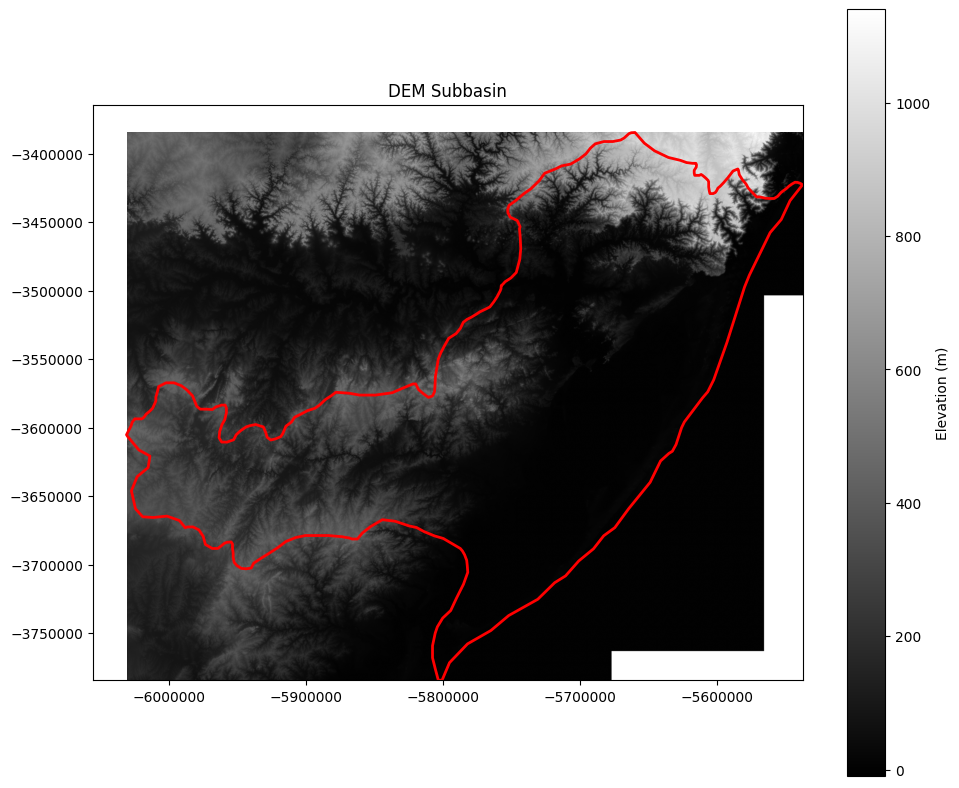

In [52]:
# Display the DEM

fig, ax = plt.subplots(figsize=(10, 8))

# Plot with grayscale colormap
im = ax.imshow(dem_subbasin.squeeze(), cmap='gray', 
               extent=[dem_subbasin.x.min(), dem_subbasin.x.max(),
                       dem_subbasin.y.min(), dem_subbasin.y.max()])

# Display the subbasin over
gdf_subbasin.to_crs(3857).plot(ax=ax, facecolor='none', edgecolor='red', linewidth=2)

# Add colorbar
cbar = plt.colorbar(im, ax=ax, label='Elevation (m)')

# Add title with CRS info
ax.set_title(f'DEM Subbasin')

# Optional: format coordinates with thousand separators
ax.ticklabel_format(style='plain', useOffset=False)

plt.tight_layout()
plt.show()

#### 7:  Compute streams (with Strahler orders) and catchments (further sub-basins) for the target area

Define a recommended density of stations for the analysed area, expressed as:

- Stations per sub-basin area
    e.g. 1 station per sub-catchment of 2000 km²
    - Therefore, choose a minimum area of 2000 for catchments in the following function:

In [4]:
gdf_catchments, gdf_streams = pyflwdir_subbasins_minarea(dem_subbasin, gdf_subbasin, min_sto=4,
                                                         save_data=True,
                                                         file_name1=f'{ID_SUBBASIN}_catchments',
                                                         file_name2=f'{ID_SUBBASIN}_streams',
                                                         file_name3=f'{ID_SUBBASIN}_flowdir')

Raster CRS: PROJCS["WGS 84 / Pseudo-Mercator",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Mercator_1SP"],PARAMETER["central_meridian",0],PARAMETER["scale_factor",1],PARAMETER["false_easting",0],PARAMETER["false_northing",0],UNIT["metre",1],AXIS["Easting",EAST],AXIS["Northing",NORTH],EXTENSION["PROJ4","+proj=merc +a=6378137 +b=6378137 +lat_ts=0 +lon_0=0 +x_0=0 +y_0=0 +k=1 +units=m +nadgrids=@null +wktext +no_defs"],AUTHORITY["EPSG","3857"]]
Input GeoDataFrame CRS: EPSG:4326
Reprojecting GeoDataFrame from EPSG:4326 to PROJCS["WGS 84 / Pseudo-Mercator",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPS

#### 8:  Check station density for sub-catchments area size

The following function analyse_station_density_catchments() checks how many of stations are in each catchment, and display a map with the streams (styled according to their Strahler order), the catchments (styled according to the presence of stations).

In [2]:
### Loading data previously created, if needed:
###############################################

gdf_catchments = gpd.read_file(f'outputs/{ID_SUBBASIN}_catchments_2000.geojson')
gdf_streams = gpd.read_file(f'outputs/{ID_SUBBASIN}_streams.geojson')

# Load stations with data
# And strip time series from them, leaving only unique stations
gdf_station_flow_series = gpd.read_file(f'outputs/{ID_SUBBASIN}_stations_flowseries.geojson')

gdf_stations = (
    gpd.GeoDataFrame(
        gdf_station_flow_series[
            ['codigoestacao', 'Operadora_Sigla', 'Municipio_Nome', 'geometry']
        ]
        .groupby('codigoestacao', as_index=False)
        .last(),
        geometry='geometry',
        crs=gdf_station_flow_series.crs
    )
)

# Load all stations
gdf_stations_all = gpd.read_file(f'outputs/{ID_SUBBASIN}_stations_all.geojson')
gdf_stations_all = (
    gpd.GeoDataFrame(
        gdf_stations_all[
            ['codigoestacao', 'Operadora_Sigla', 'Municipio_Nome', 'geometry']
        ]
        .groupby('codigoestacao', as_index=False)
        .last(),
        geometry='geometry',
        crs=gdf_stations_all.crs
    )
)

In [3]:
# Sometimes the stations may be slightly outside our sub-basin area.
# One possibility is to snap them to our sub-basin
gdf_stations2 = snap_stations(gdf_stations, gdf_subbasin)

# Or alternatively eliminate those stations
# gdf_stations2 = gdf_stations.clip(gdf_subbasin)

# Perform count of stations per catchments, and display catchments
# coloured by either having or not having stations, streams coloured
# by their Strahler orders, and the stations. Optionally, can filter
# the streams to only be displayed over a certain strahler order (Standard: Strahler Order 6)
# Make sure that the geodataframes are in the same CRS
gdf_catchments, map = analyse_station_density_catchments(gdf_stations2.to_crs(3857),
                                                         gdf_subbasin.to_crs(3857),
                                                         gdf_catchments.to_crs(3857),
                                                         gdf_streams.to_crs(3857))

map

d:\Flávio Rocha USER\OneDrive\University of Twente\MSc 2025-2027\Y1Q2 Sci Prog for Geospatial Sciences\SciProgr2025_Assign1_Avinash_Flavio\.venv\Lib\site-packages\geopandas\geodataframe.py:1969: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Stations have been snapped to the target geometry: 1.
Creating a Folium Map visualization.


d:\Flávio Rocha USER\OneDrive\University of Twente\MSc 2025-2027\Y1Q2 Sci Prog for Geospatial Sciences\SciProgr2025_Assign1_Avinash_Flavio\src\utils.py:26: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  geojson_display_dicts[0]['data'].geometry.centroid.y.mean(),
d:\Flávio Rocha USER\OneDrive\University of Twente\MSc 2025-2027\Y1Q2 Sci Prog for Geospatial Sciences\SciProgr2025_Assign1_Avinash_Flavio\src\utils.py:27: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  geojson_display_dicts[0]['data'].geometry.centroid.x.mean()


In comparison, the block below display all the stations retrieved for the sub-basin.
Usually, the stations have a much better distribution along the sub-basin.
But if we consider only the stations which data can be retrieved from, the robustness of the monitoring is much lower.

In [6]:
# Filter stations that do not have data
gdf_stations_without_data = gdf_stations_all[~gdf_stations_all['codigoestacao'].isin(gdf_stations2['codigoestacao'])]


# Build a colormap for Streams, based on Strahler order
min_order = gdf_streams["strord"].min()
max_order = gdf_streams["strord"].max()
strord_cmap = cm.linear.Blues_09.scale(min_order, max_order)
strord_cmap.caption = "Strahler Order"

# Style function for the streams, displayed according to Strahler order
def stream_style_function(feature):
    order = feature["properties"]["strord"]

    return {
        "color": strord_cmap(order),
        "weight": order * 0.6,   # scale thickness
        "opacity": 0.9
    }


# Build a colormap for catchments, based in the existence or absence of stations on them
catch_cmap = cm.linear.RdYlGn_08.scale(0, 1)
catch_cmap.caption = "Stations on catchments"

# Style function for the catchments, displayed according to either having telemetering stations or not
def catchment_style_function(feature):
    has_stations = bool(feature["properties"]["count_st_cathcm"])

    return {
        "fillColor": catch_cmap(has_stations), # Color the catchments according to the presence or absence of stations
        "color": "black",
        "weight": 1,
        "fillOpacity": 0.5,
    }

# Filter which minimum stream Strahler Order will be displayed
gdf_streams_filtered = gdf_streams[gdf_streams["strord"] >= 6]

geojson_display_dicts = [
    {
        'data' : gdf_stations_without_data,
        'attribute_map' :
        {
            "codigoestacao": "Station ID",
            "Operadora_Sigla": "Responsable",
            "Municipio_Nome": "Municipality"
        },
        'feature_settings' : {}, #Point features, no style_function
        'marker': folium.Marker(icon=folium.Icon(icon="location-dot", prefix="fa", icon_color="red"))
    },
    {
        'data' : gdf_stations2,
        'attribute_map':
        {
            "codigoestacao": "Station ID",
            "Operadora_Sigla": "Responsable",
            "Municipio_Nome": "Municipality"
        },
        'feature_settings': {}, #Point features, no style_function
        'marker': folium.Marker(icon=folium.Icon(icon="location-dot", prefix="fa", icon_color="green"))
    },
    {
        'data' : gdf_subbasin,
        'attribute_map' :
        {
            "DNS_DNB_CD": "Code of the basin",
            "DNS_NU_SUB": "Code of the sub-basin",
            "DNS_NM": "Name"
        },
        'feature_settings':
        {
            "color": "red",
            "weight": 3,
            "fill": False
        }, # Sub-basin feature style
    },
    {
        'data' : gdf_catchments,
        'attribute_map' :
        {
            "value": "#",
            "area_km2": "Area",
            "count_st_cathcm": "Station Count"
        },
        'feature_settings' : catchment_style_function, # Function to dinamically adjust the color of catchments 
    },
    {
        'data' : gdf_streams_filtered,
        'attribute_map' :
        {
            "strord": 'Strahler Order'
        },
        'feature_settings' : stream_style_function, # Function to dinamically adjust width and color of streams absed on order 
    }
]

# Plots both the filtered stations with data, and the respective sub-basin
display_Folium_map(geojson_display_dicts)

Creating a Folium Map visualization.


d:\Flávio Rocha USER\OneDrive\University of Twente\MSc 2025-2027\Y1Q2 Sci Prog for Geospatial Sciences\SciProgr2025_Assign1_Avinash_Flavio\src\utils.py:26: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  geojson_display_dicts[0]['data'].geometry.centroid.y.mean(),
d:\Flávio Rocha USER\OneDrive\University of Twente\MSc 2025-2027\Y1Q2 Sci Prog for Geospatial Sciences\SciProgr2025_Assign1_Avinash_Flavio\src\utils.py:27: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  geojson_display_dicts[0]['data'].geometry.centroid.x.mean()


Thus, by analysing these two displays, the decision maker could either propose new sites for
telemetering water stations, or to ensure data reactivation and availability of
stations that exist and are within catchments without water monitoring data.

#### 09:  Data visualization - Pairplot representation

After computing catchments, streams and checking the count of stations in each sub-basin/catchment,
some spatial join operations are performed to create potentially relevant data to be seen and analysed.

In [ ]:
#######################################################
# Computing some attributes for data analysis and data visualization - gdf_catchments
# Perform spatial join to relate streams and stations
#######################################################

# # Filter which minimum stream Strahler Order will be displayed
gdf_streams_filtered = gdf_streams[gdf_streams["strord"] >= 6]

# Compute length of the streams
gdf_streams_filtered['length_km'] = gdf_streams_filtered.geometry.length/1000

# Relate streams to catchments through spatial joint
joined = gpd.sjoin(gdf_streams_filtered, gdf_catchments, how='left', predicate='within')

# Group by polygon index and sum the lengths
length_per_polygon = joined.groupby('index_right')['length_km'].sum()

# Add the summed lengths back to the polygons GeoDataFrame
gdf_catchments['total_stream_length_km'] = gdf_catchments.index.map(length_per_polygon).fillna(0)

# Now calculate the lengths again, for each Strahler Order
for order in sorted(gdf_streams_filtered['strord'].unique()):
    # Perform spatial join
    joined = gpd.sjoin(gdf_streams_filtered[gdf_streams_filtered['strord'] == order], gdf_catchments, how='left', predicate='within')
    # Group and sum the lengths
    length_per_polygon = joined.groupby('index_right')['length_km'].sum()
    # Add the summed lengths back to the catchments GeoDataFrame
    gdf_catchments[f'stream_o{order}_length_km'] = gdf_catchments.index.map(length_per_polygon).fillna(0)



Displaying the visualization with seaborn:

Text(0.5, 0.98, 'Pairwise relationships across catchment sub-basins, stations and streams')

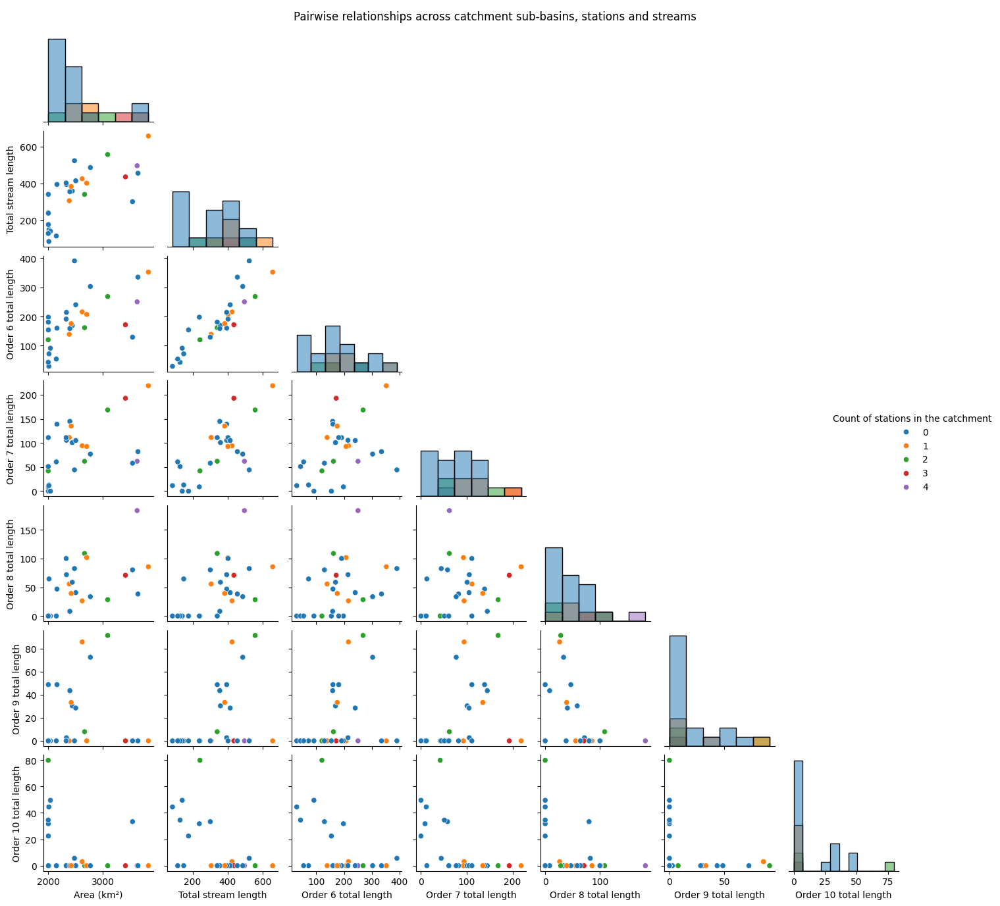

In [72]:
import seaborn as sns
import matplotlib.pyplot as plt

# To display a pairwise visualization, a subset of the data will be selected
sub_gdf = gdf_catchments.drop(columns=['value', 'geometry'])

######### A pair plot will be displayed for pairwise visualization

# Defne palette for plot
num_classes = len(gdf_catchments['count_st_cathcm'].unique())
palette = sns.color_palette("tab10", num_classes)

# Corner is set true so we visualize only half of the plot-array (since it's symmetric, only half of it is necesssary).
pp = sns.pairplot(sub_gdf, height=2, corner=True, hue='count_st_cathcm', palette=palette, diag_kind='hist')
pp.legend.set_title('Count of stations in the catchment')

# To better display the labels of the axis, a dictionary is created to map each column name to a label name for displaying 
axis_labels = {
    'area_km2': 'Area (km²)',
    'total_stream_length_km': 'Total stream length',
    'stream_o6_length_km': 'Order 6 total length',
    'stream_o7_length_km': 'Order 7 total length',
    'stream_o8_length_km': 'Order 8 total length',
    'stream_o9_length_km': 'Order 9 total length',
    'stream_o10_length_km': 'Order 10 total length'
    }

# By iterating through the axes of the pp PairGrid object, the designed label is assigned for each ax/axes
for ax in pp.axes.flatten():
    if ax is not None:
        xlabel = ax.get_xlabel()
        ylabel = ax.get_ylabel()

        if xlabel in axis_labels:
            ax.set_xlabel(axis_labels[xlabel])
        if ylabel in axis_labels:
            ax.set_ylabel(axis_labels[ylabel])

pp.fig.suptitle('Pairwise relationships across catchment sub-basins, stations and streams')